In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
        #### END CODE HERE ####
    )

In [ ]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


In [ ]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [ ]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


In [ ]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #Alternative: return torch.randn(n_samples, z_dim).to(device)
    #### END CODE HERE ####

In [ ]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device) == device

test_get_noise(1000, 100, 'cpu')
try:
    test_get_noise(1000, 32, 'cuda')
except Exception as e: 
    print(e)
print("Success!")


Success!


In [ ]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [ ]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


In [ ]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [ ]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


In [ ]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [ ]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_fake_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [ ]:
def test_disc_reasonable(num_images=10):
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu') - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [ ]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [ ]:
def test_gen_reasonable(num_images=10):
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    assert torch.all(torch.abs(get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu') - 1) < 1e-5)

def test_gen_loss(num_images):
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))

test_gen_reasonable()
test_gen_loss(18)
print("Success!")

Success!


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.3952321341037761, discriminator loss: 0.4181953854560852


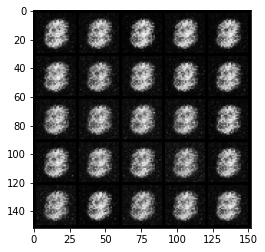

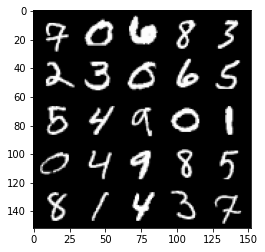

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.7554078960418702, discriminator loss: 0.27885288530588165


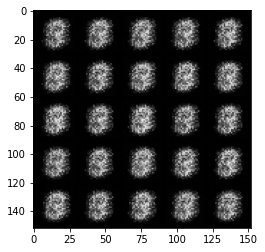

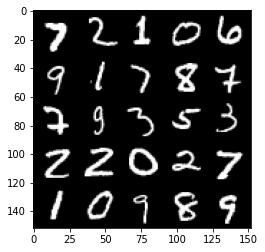

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 2.066873862743377, discriminator loss: 0.15765680107474334


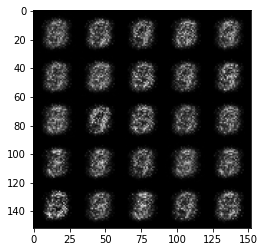

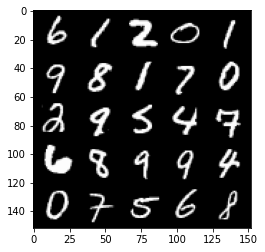

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.6663472468852993, discriminator loss: 0.22863807120919222


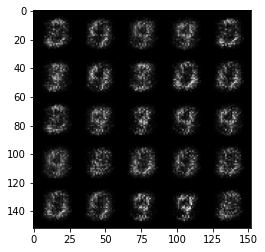

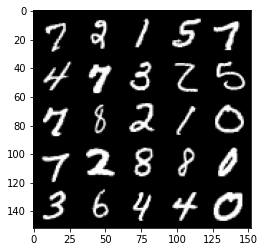

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.6400100159645081, discriminator loss: 0.2107921756803988


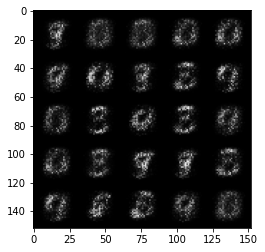

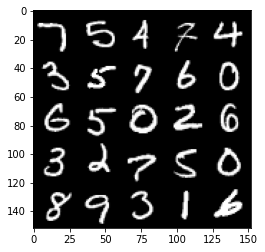

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.8973285918235776, discriminator loss: 0.17330326557159428


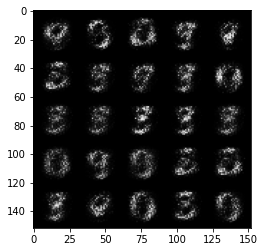

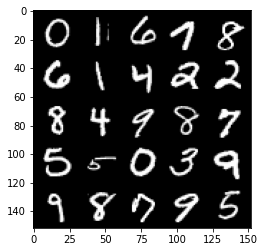

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.3100721662044523, discriminator loss: 0.13741273179650304


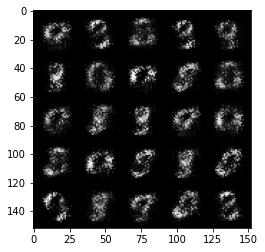

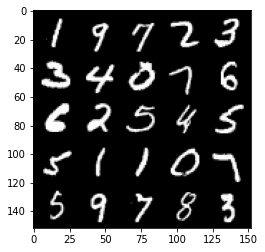

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.724087172508239, discriminator loss: 0.10679498448967933


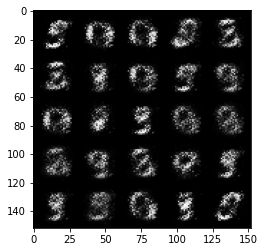

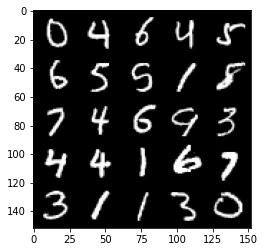

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.239426409721373, discriminator loss: 0.08113481165468697


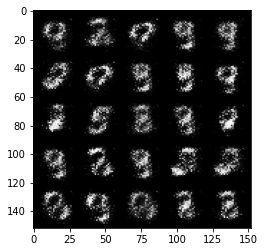

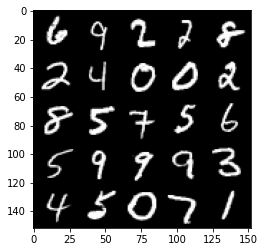

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.5695510201454166, discriminator loss: 0.06701645480841405


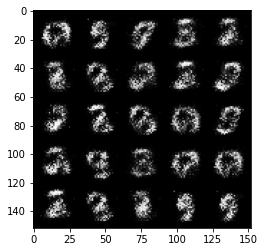

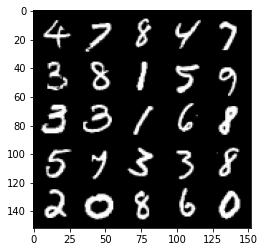

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.7510473752021807, discriminator loss: 0.054412236608564826


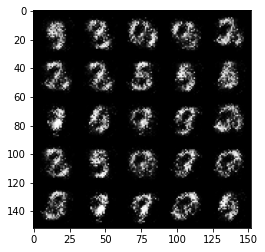

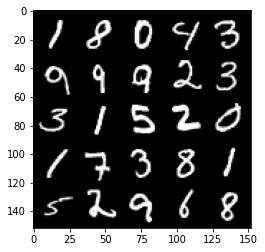

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 4.047816472530366, discriminator loss: 0.05418474902212617


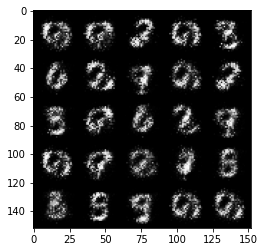

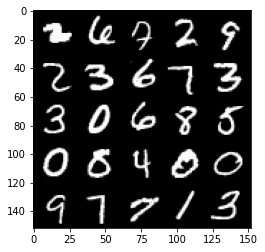

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 4.058211101055141, discriminator loss: 0.05758742201328277


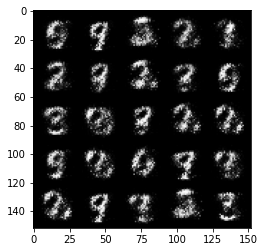

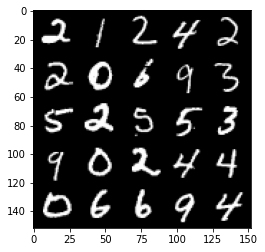

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.274020124912262, discriminator loss: 0.05102134463563561


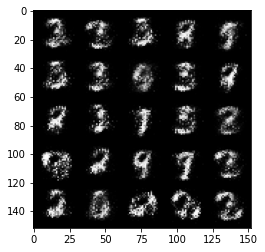

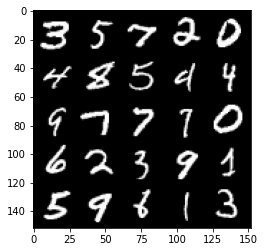

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.164306510448453, discriminator loss: 0.04864718709513544


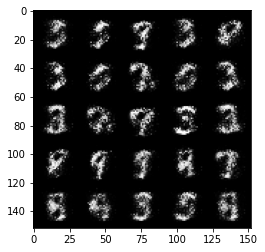

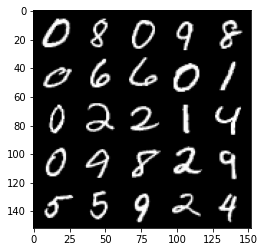

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.160934459209442, discriminator loss: 0.056441940750926727


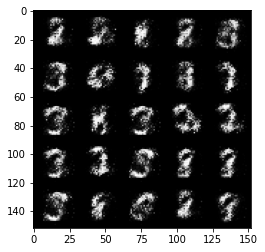

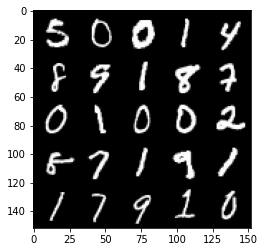

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.222087060451508, discriminator loss: 0.04870522740483284


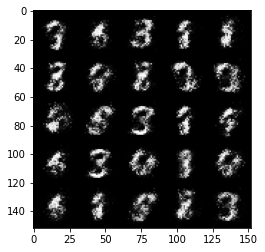

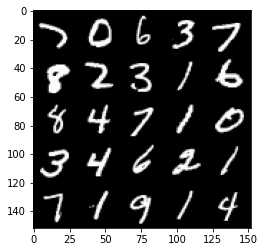

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.230562828063965, discriminator loss: 0.04943043116480112


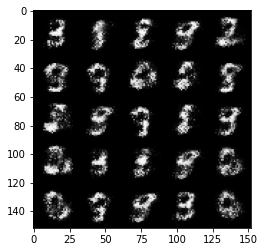

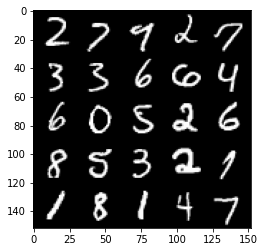

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.302679798603058, discriminator loss: 0.053846851207315916


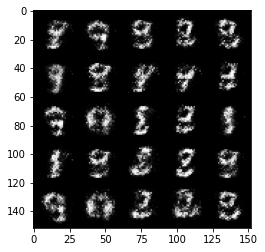

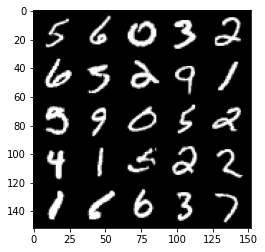

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.291438635826107, discriminator loss: 0.05838003091141584


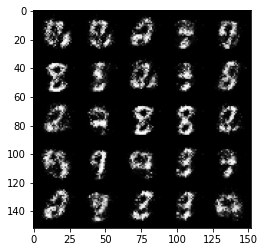

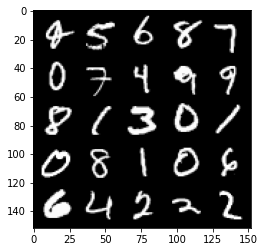

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.227345032215122, discriminator loss: 0.06235625297948721


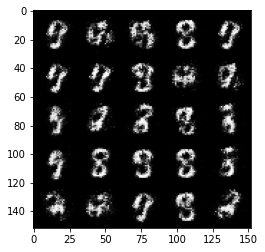

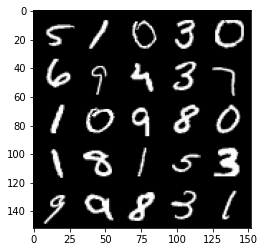

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.0910496559143095, discriminator loss: 0.06815380043536426


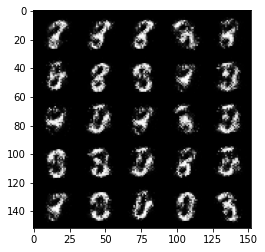

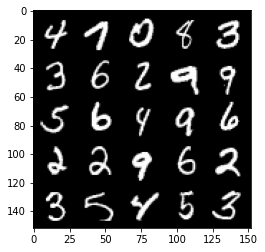

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 4.357657843589784, discriminator loss: 0.05510568111762403


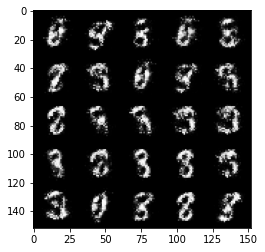

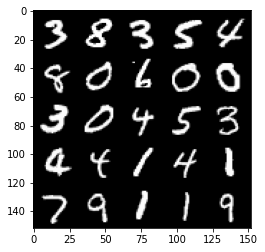

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.283342382431034, discriminator loss: 0.06211651926860214


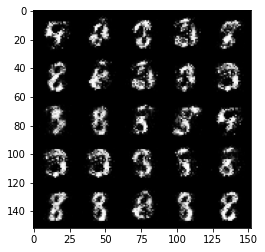

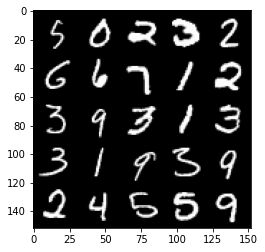

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 4.339097286701205, discriminator loss: 0.06718795291334388


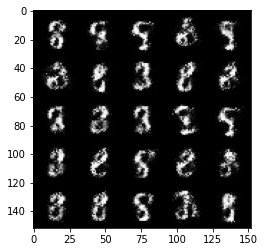

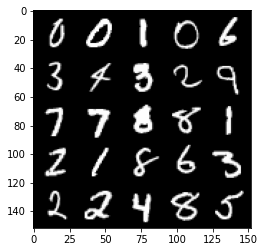

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 4.055307117462158, discriminator loss: 0.09101488482952118


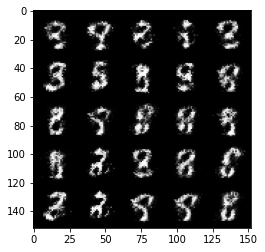

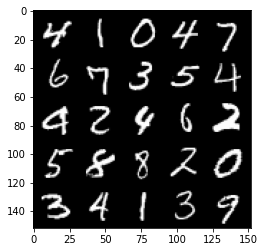

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 4.162372270584112, discriminator loss: 0.09456998659670353


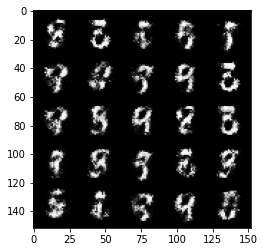

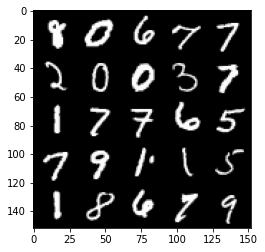

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 4.1180875945091255, discriminator loss: 0.0899095250964164


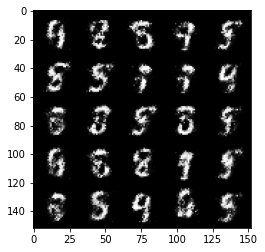

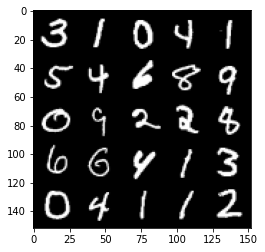

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 4.02943348407745, discriminator loss: 0.0820688579156994


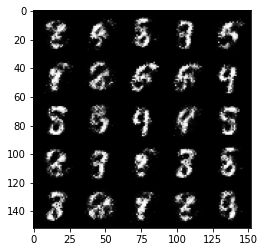

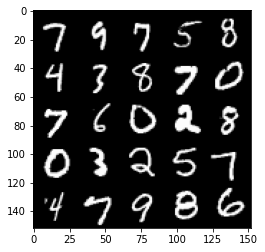

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.697994206428525, discriminator loss: 0.10886553480476142


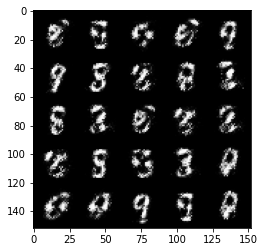

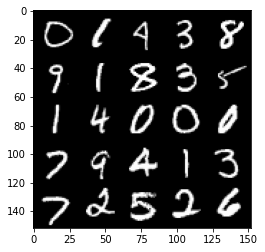

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.8509090790748575, discriminator loss: 0.10293412601202734


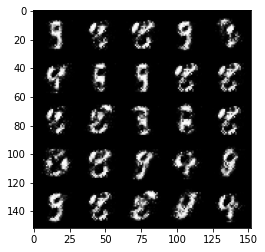

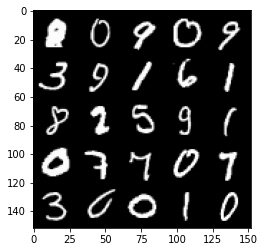

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 4.091309748649597, discriminator loss: 0.08356418748945008


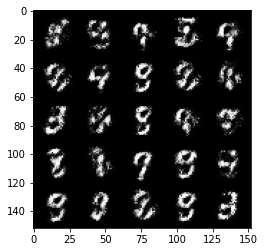

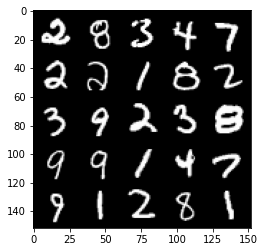

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.986697209835054, discriminator loss: 0.0856544346660376


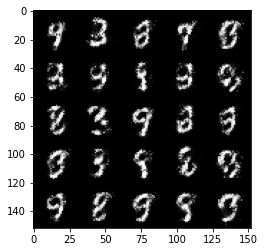

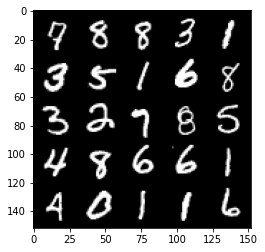

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.8188141441345165, discriminator loss: 0.1071593981385231


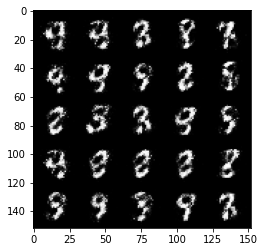

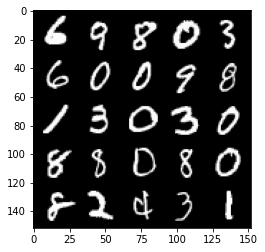

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.798943396568298, discriminator loss: 0.10032018326967955


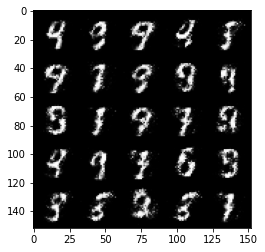

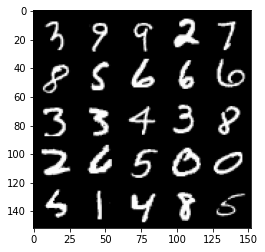

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.7775559139251724, discriminator loss: 0.10190060348063701


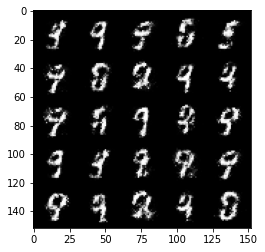

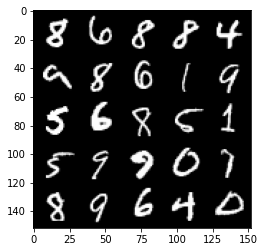

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.6410008935928353, discriminator loss: 0.11589446433633577


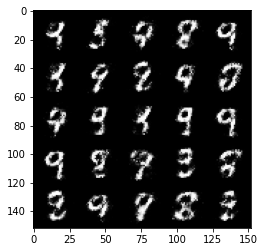

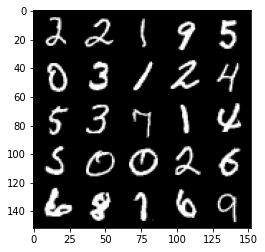

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.6095135087966903, discriminator loss: 0.11442169348150487


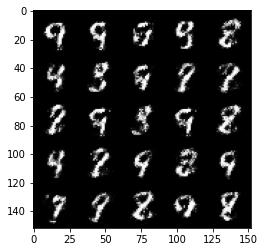

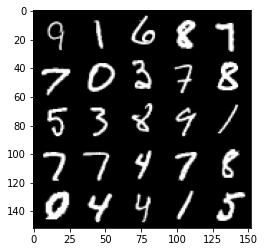

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.6004116029739377, discriminator loss: 0.12403345980495212


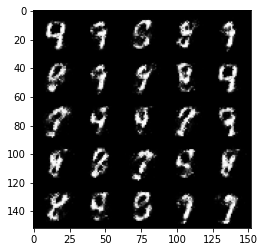

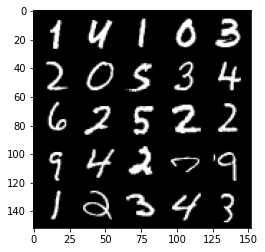

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.4882919173240663, discriminator loss: 0.13195824702829115


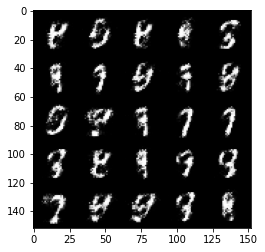

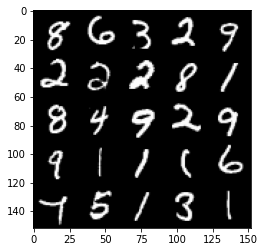

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.6225914587974573, discriminator loss: 0.12634132952988145


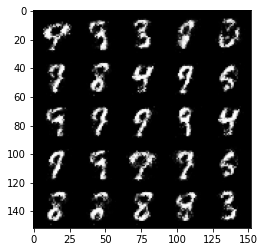

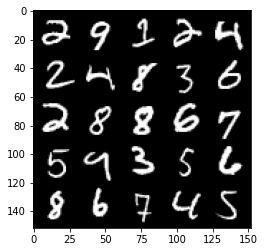

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.2351553363800014, discriminator loss: 0.14848146492242814


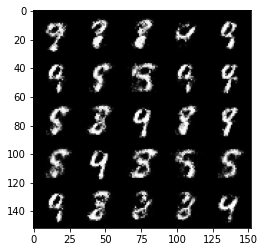

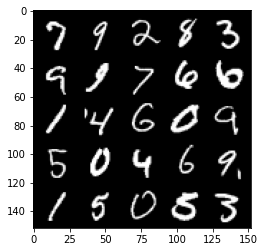

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.27813551712036, discriminator loss: 0.14062731924653046


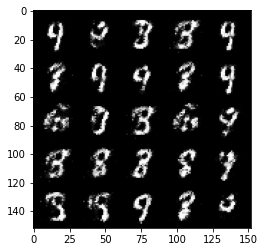

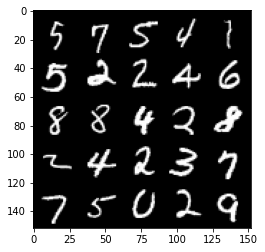

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.2474442048072802, discriminator loss: 0.1502373201698064


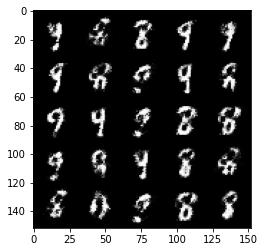

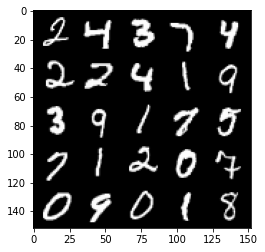

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.2737739114761375, discriminator loss: 0.14547020597755903


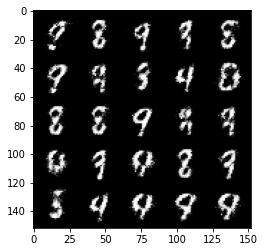

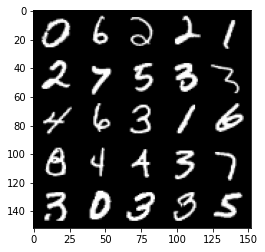

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.0718282876014693, discriminator loss: 0.16600374773144708


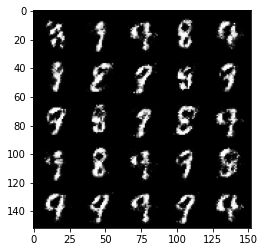

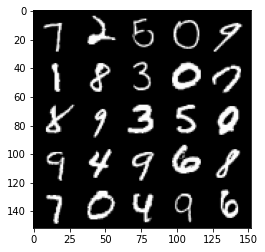

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.065808184146884, discriminator loss: 0.1777871249616146


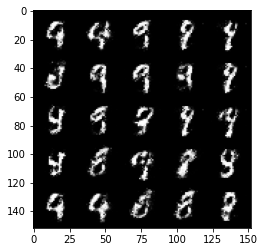

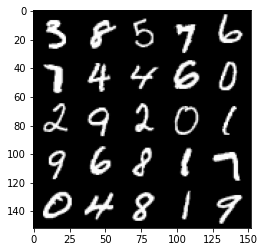

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 2.9403149709701535, discriminator loss: 0.17198250825703154


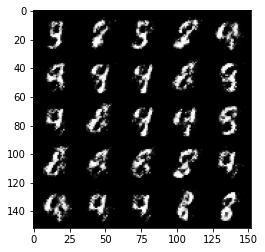

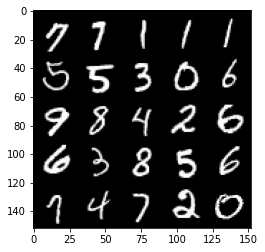

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 3.127643741607663, discriminator loss: 0.15622215707600123


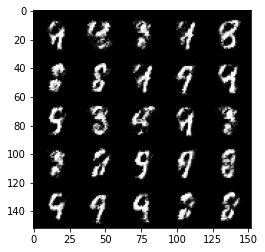

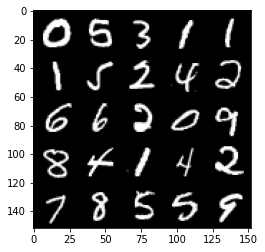

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 3.053835373401642, discriminator loss: 0.1658189492672682


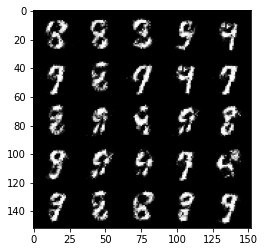

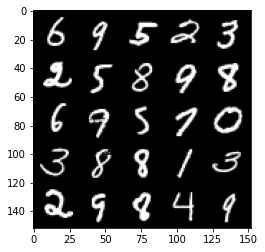

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.9981460976600642, discriminator loss: 0.17711114774644385


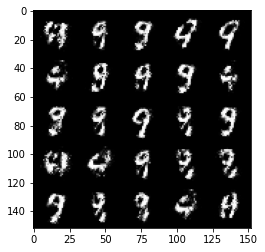

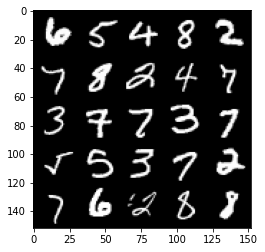

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 3.0453843913078313, discriminator loss: 0.1809261258393526


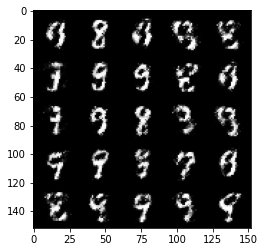

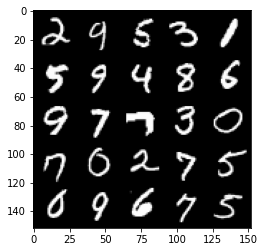

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.909306768894193, discriminator loss: 0.19027794164419182


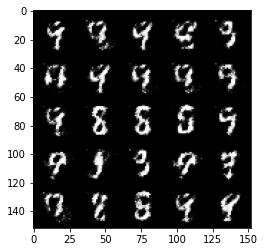

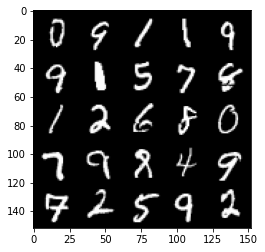

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.9334654235839834, discriminator loss: 0.1827991916537284


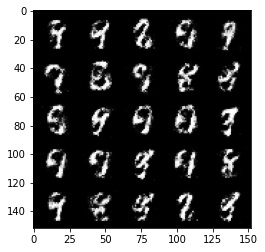

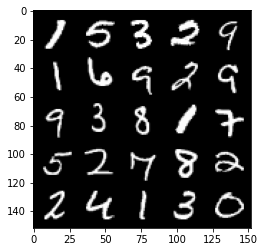

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.9580729494094866, discriminator loss: 0.178382306560874


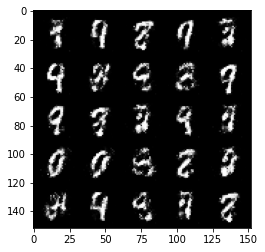

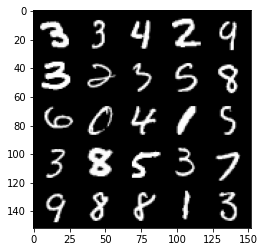

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.6879046316146873, discriminator loss: 0.20293384441733375


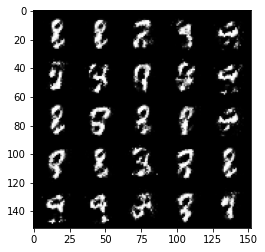

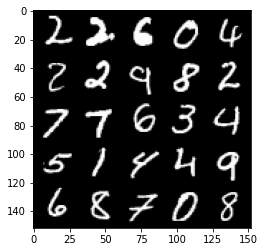

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.706683705806732, discriminator loss: 0.20554059003293493


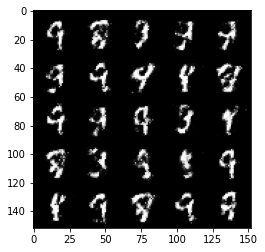

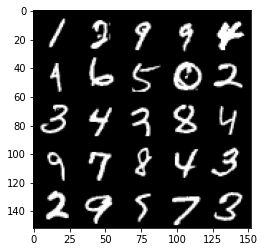

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.667962532043457, discriminator loss: 0.20997045508027087


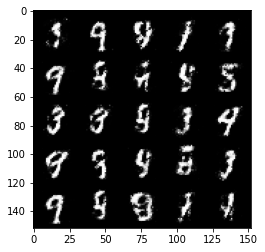

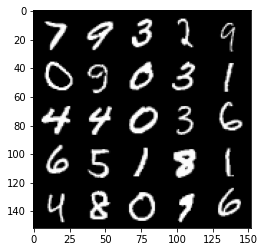

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.70642896461487, discriminator loss: 0.20096811510622503


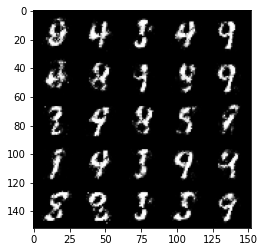

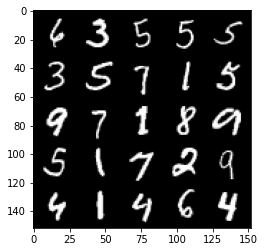

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.7132496562004103, discriminator loss: 0.19786815543472774


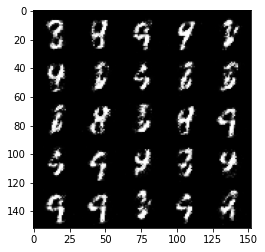

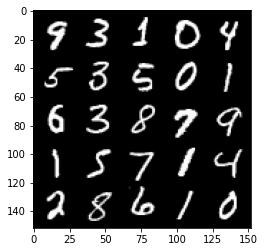

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.6799537124633805, discriminator loss: 0.20696132823824864


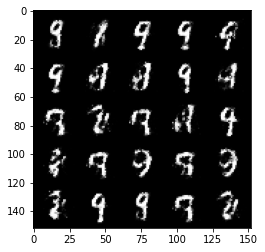

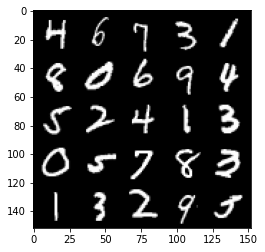

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.624382886886598, discriminator loss: 0.21745148921012883


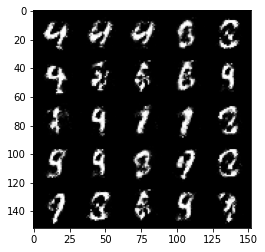

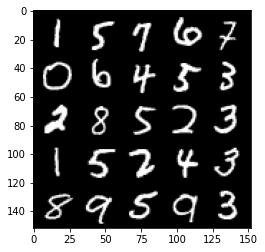

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.5750747551918027, discriminator loss: 0.21768872773647294


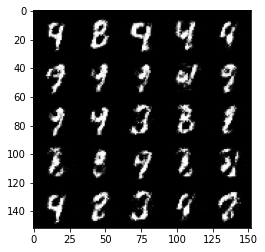

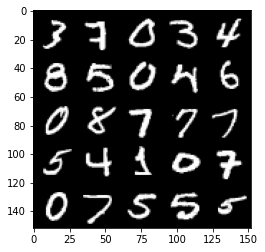

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.6277105555534357, discriminator loss: 0.2132899863868952


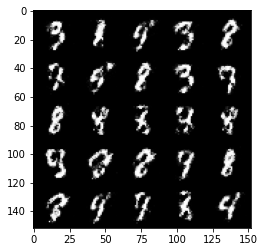

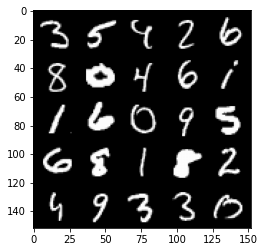

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.4712313320636747, discriminator loss: 0.2370317763388158


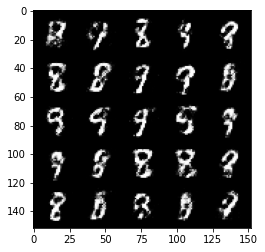

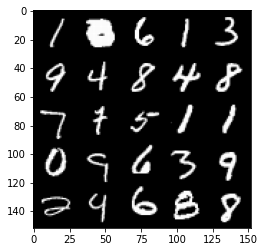

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.457674485683442, discriminator loss: 0.23807399538159355


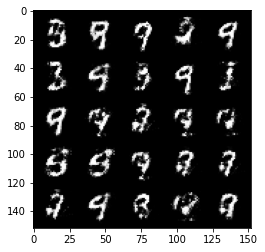

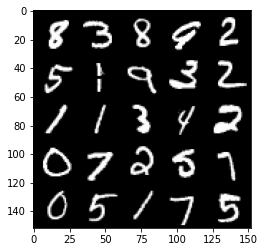

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.37598021197319, discriminator loss: 0.2487950136363506


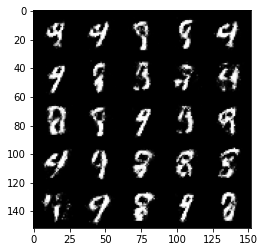

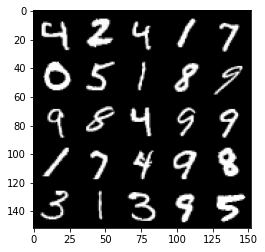

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.4033549671173122, discriminator loss: 0.2306843853294847


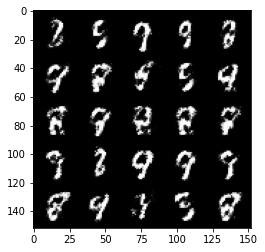

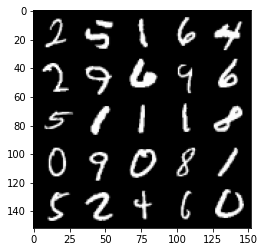

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.4898928318023685, discriminator loss: 0.23767599326372163


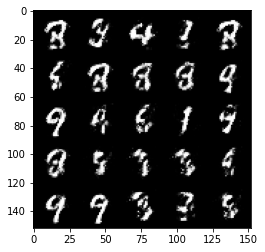

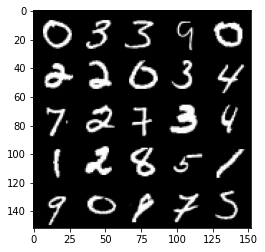

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.3861390893459298, discriminator loss: 0.25573572504520414


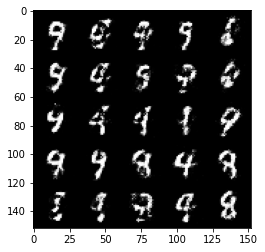

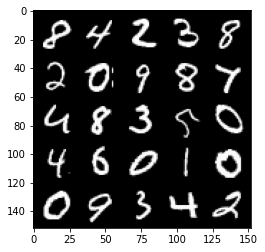

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.4517525744438164, discriminator loss: 0.23125253453850744


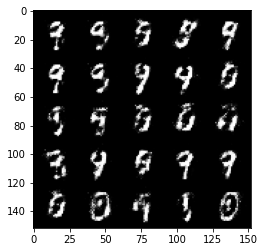

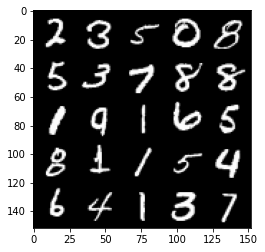

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.3467360849380485, discriminator loss: 0.2657495241165162


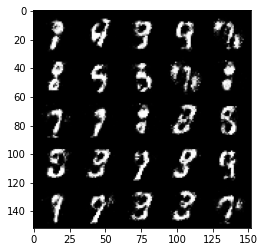

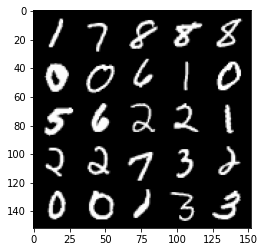

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.21422920703888, discriminator loss: 0.28128568962216405


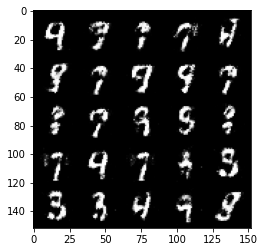

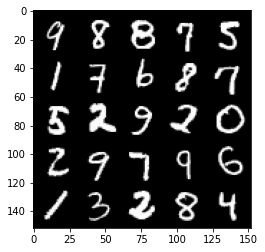

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.2885679197311424, discriminator loss: 0.24799132910370816


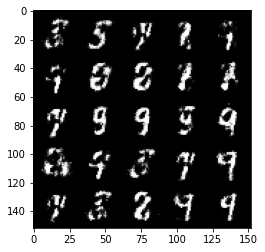

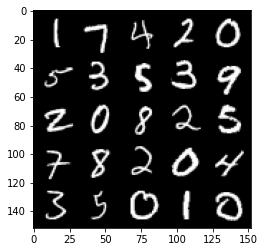

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.3488635032176974, discriminator loss: 0.2441525115966797


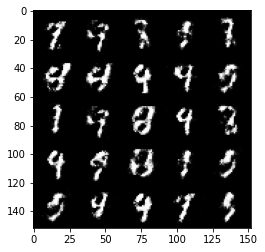

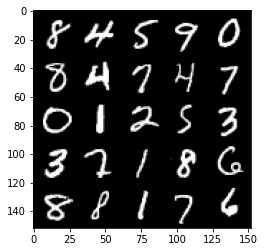

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.384975731611254, discriminator loss: 0.24005241352319714


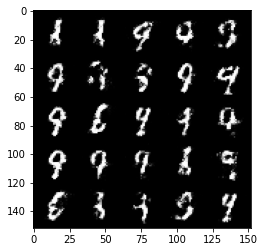

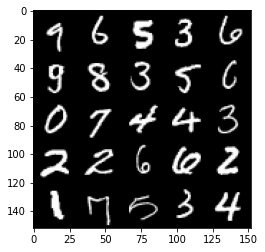

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.434425755977629, discriminator loss: 0.22772732946276641


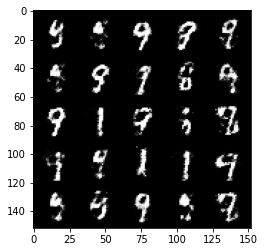

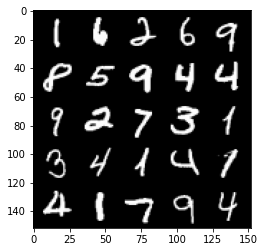

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.379457285404205, discriminator loss: 0.24330854642391214


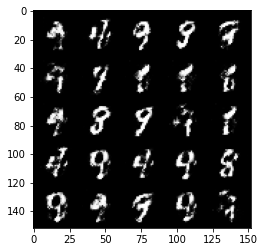

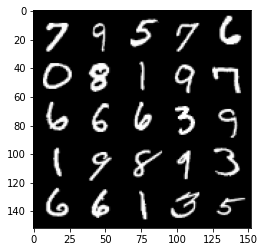

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.3067278985977175, discriminator loss: 0.2505206212401389


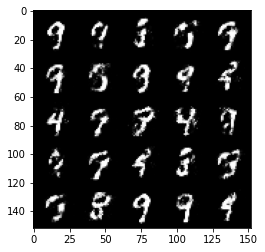

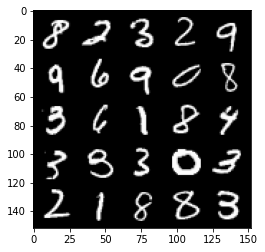

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.3462771558761593, discriminator loss: 0.24575441199541084


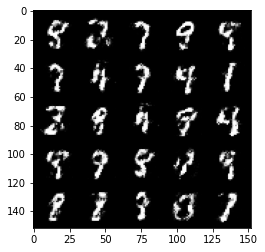

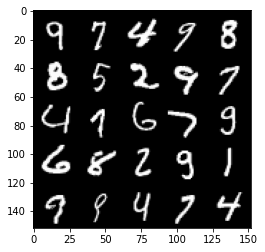

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.2926004917621627, discriminator loss: 0.2510236417353153


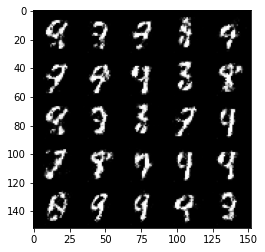

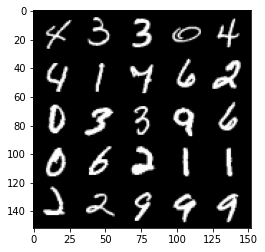

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.2057952973842596, discriminator loss: 0.2765751728415488


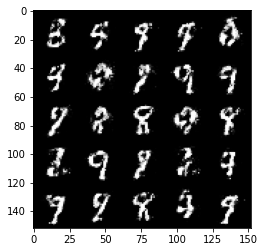

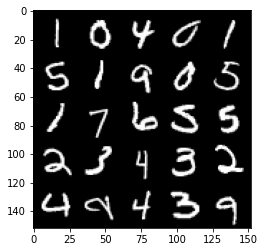

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.1491204741001133, discriminator loss: 0.2814659852087498


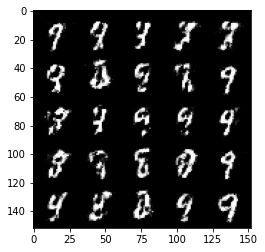

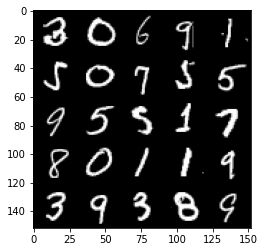

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.1664912390708926, discriminator loss: 0.2824089877605437


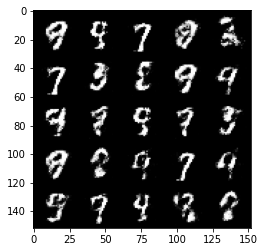

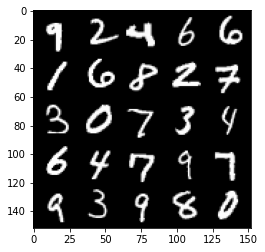

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 1.9504062767028822, discriminator loss: 0.3235050866901874


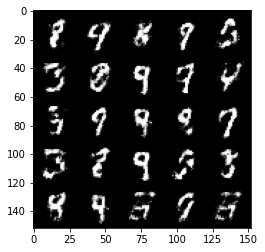

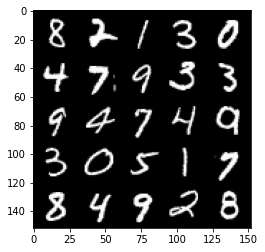

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.0534258615970598, discriminator loss: 0.29659742245078086


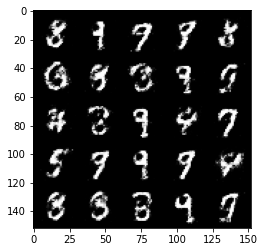

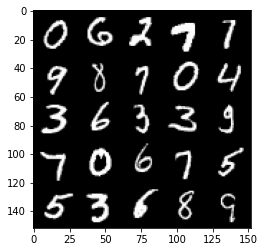

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 1.9370688862800594, discriminator loss: 0.3307741900086406


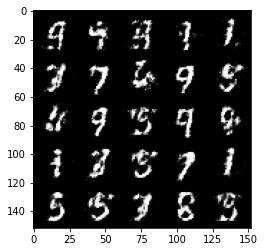

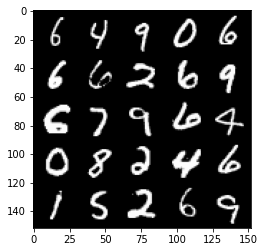

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 1.9277633948326123, discriminator loss: 0.3247773230373857


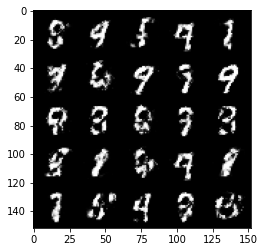

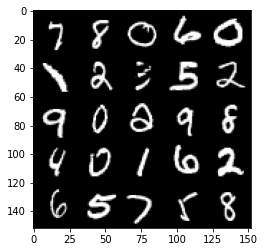

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 2.0884696300029755, discriminator loss: 0.2933295078277585


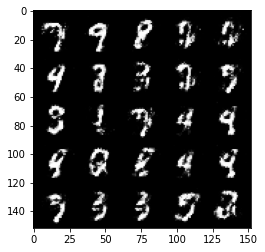

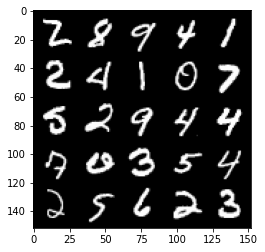

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 1.9583855731487279, discriminator loss: 0.32957647985219973


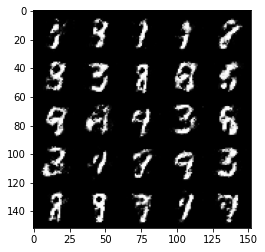

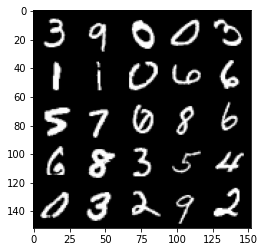

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 1.9472610099315635, discriminator loss: 0.32460247969627415


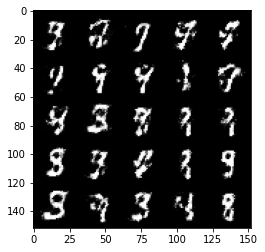

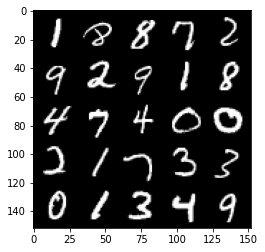

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 1.9729522273540478, discriminator loss: 0.30570225813984864


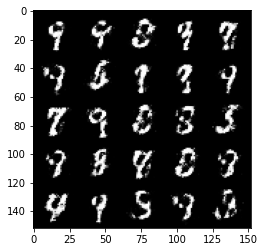

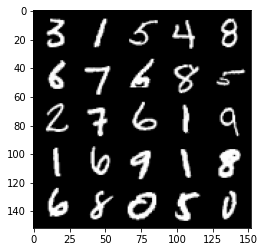

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 1.9856322414875034, discriminator loss: 0.3095744889676571


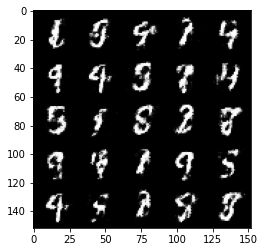

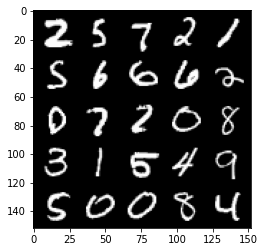

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 2.002881323575973, discriminator loss: 0.31275045284628894


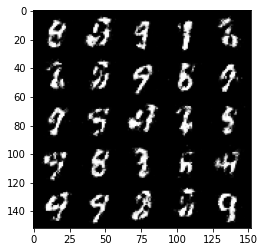

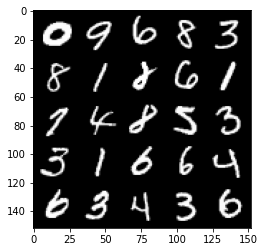

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 1.9744023494720464, discriminator loss: 0.30649257847666767


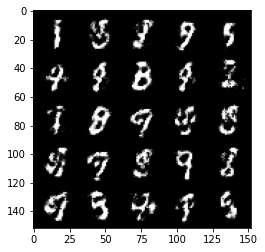

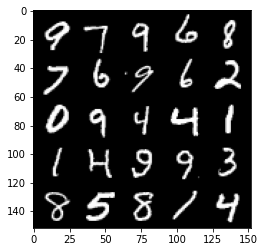

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 1.9303951466083518, discriminator loss: 0.3175456787049768


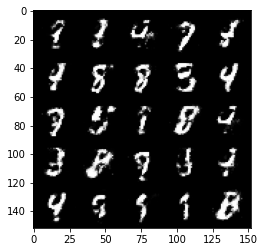

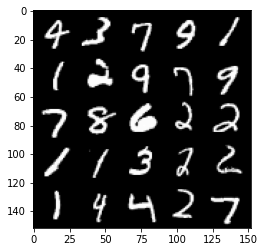

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 1.9371429998874665, discriminator loss: 0.3109652514755725


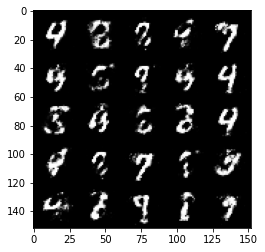

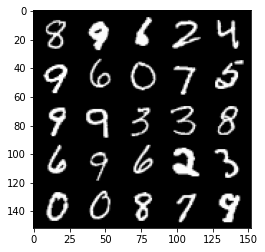

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 1.9072050433158867, discriminator loss: 0.3314333950281142


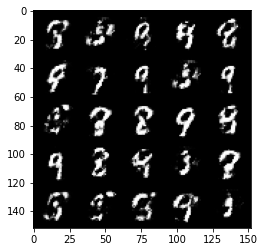

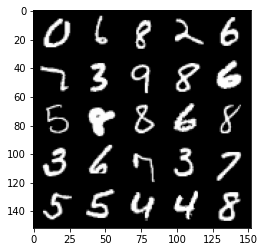

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 1.8713328328132635, discriminator loss: 0.34042214187979686


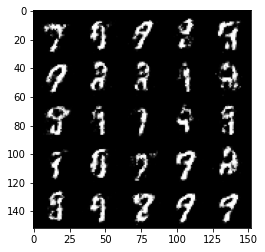

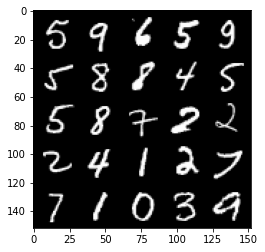

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 1.8723340229988112, discriminator loss: 0.33782100677490257


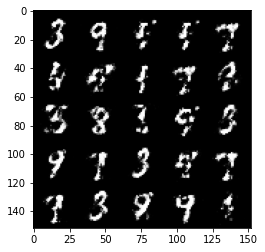

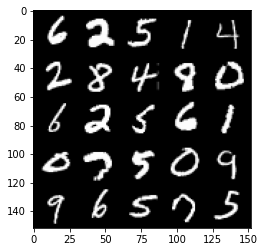

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 1.8673807122707364, discriminator loss: 0.3329793567359449


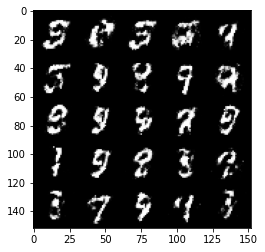

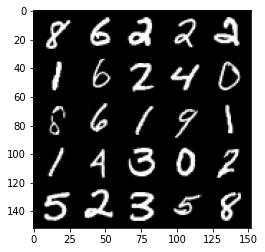

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 1.9662823774814602, discriminator loss: 0.3118095167875289


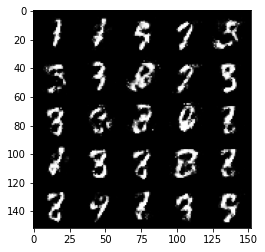

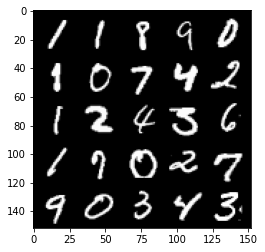

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 1.8301291656494163, discriminator loss: 0.34584174060821593


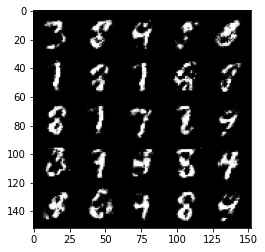

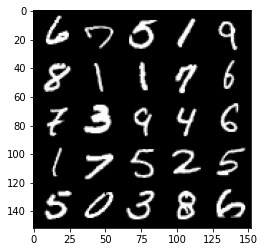

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 1.7798962051868448, discriminator loss: 0.35662222173809993


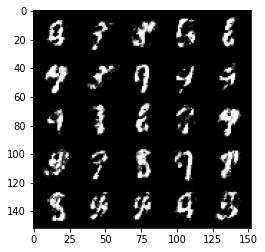

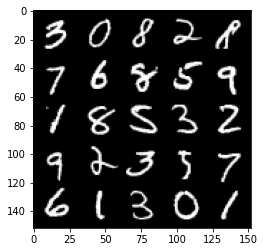

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 1.7569473044872281, discriminator loss: 0.35151903033256493


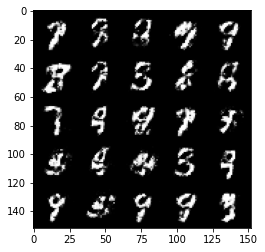

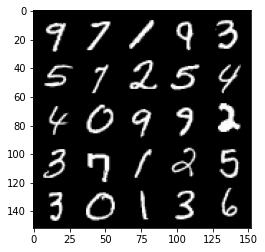

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.7615956535339365, discriminator loss: 0.352167539417744


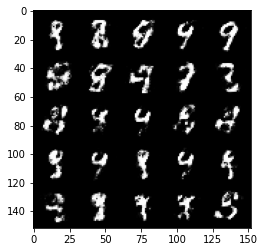

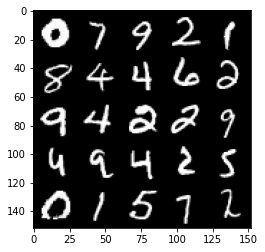

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator loss: 1.9108813738822938, discriminator loss: 0.3089120846390723


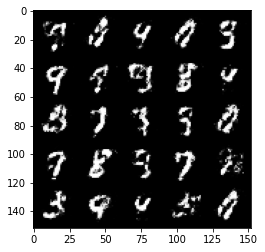

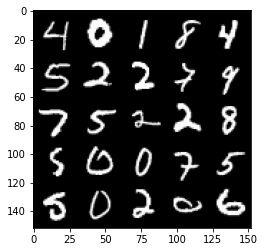

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 1.8128336255550388, discriminator loss: 0.33889107525348655


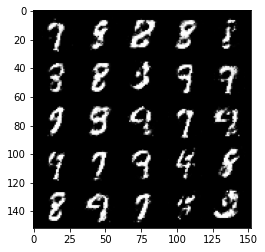

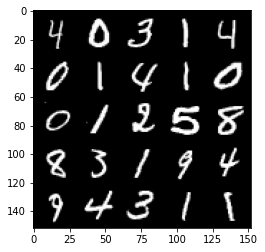

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500: Generator loss: 1.789611611127853, discriminator loss: 0.35135559713840453


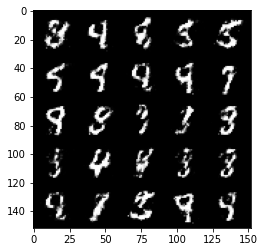

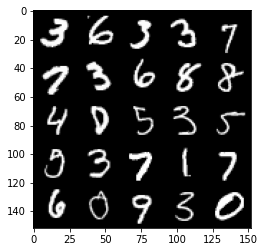

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 1.7247526202201846, discriminator loss: 0.3645423108339312


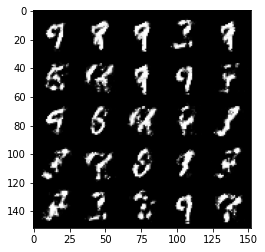

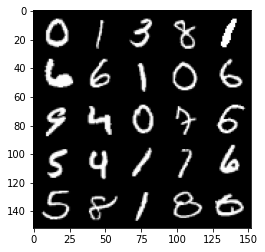

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500: Generator loss: 1.6896453862190244, discriminator loss: 0.37745785927772546


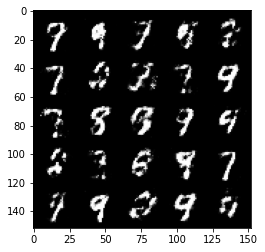

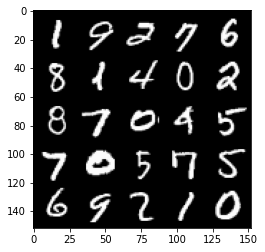

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 1.6702525372505193, discriminator loss: 0.37356846308708186


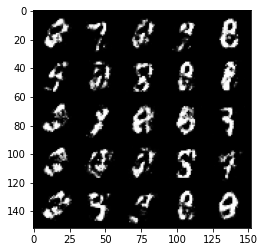

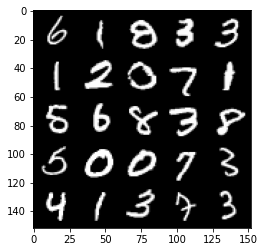

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500: Generator loss: 1.6721202523708352, discriminator loss: 0.3758501529097557


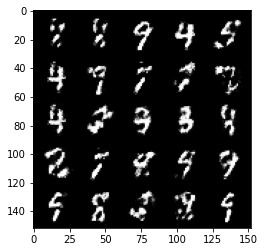

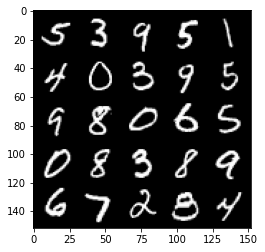

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 1.6678958451747894, discriminator loss: 0.3775483496785159


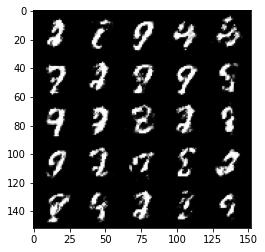

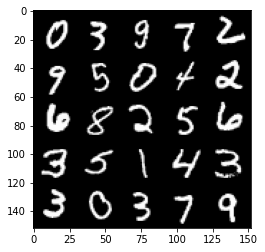

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500: Generator loss: 1.599480800151825, discriminator loss: 0.39644588708877554


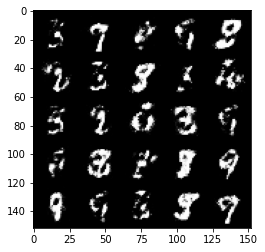

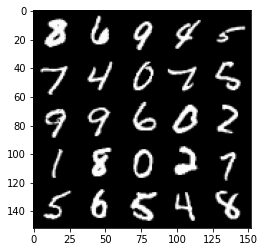

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 1.65494418144226, discriminator loss: 0.36737961691617976


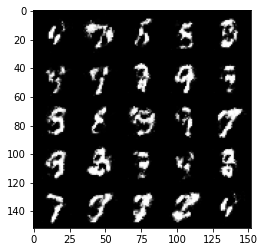

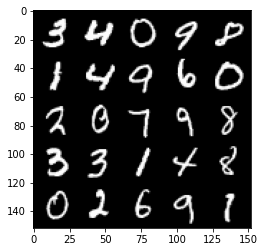

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500: Generator loss: 1.705059198141097, discriminator loss: 0.3687416120171548


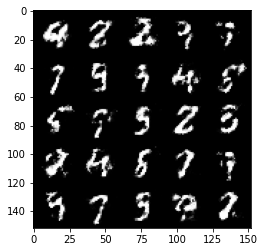

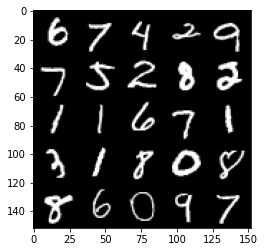

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 1.6678584136962902, discriminator loss: 0.37317434108257264


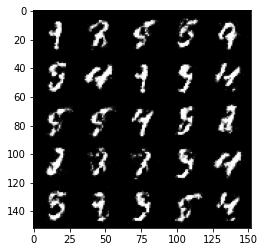

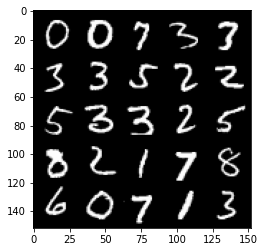

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500: Generator loss: 1.7488980851173392, discriminator loss: 0.35883743458986267


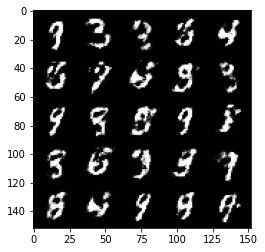

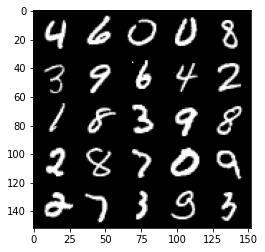

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 1.6283814065456377, discriminator loss: 0.3828246194124224


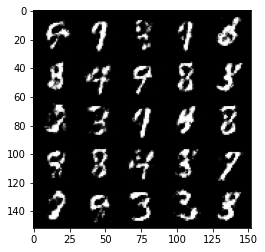

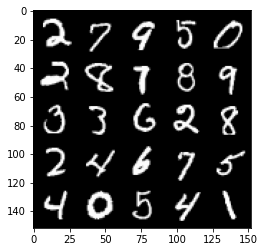

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500: Generator loss: 1.6129129886627205, discriminator loss: 0.3927552307844165


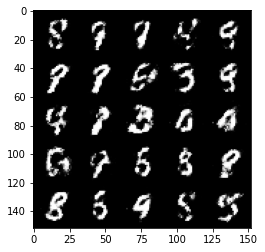

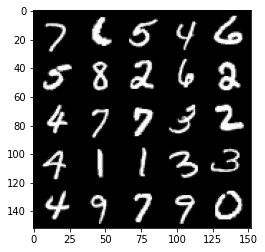

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 1.5676580123901371, discriminator loss: 0.388333164036274


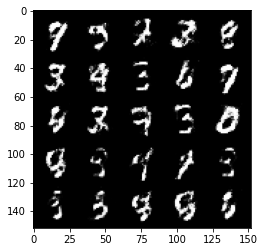

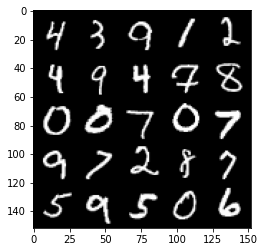

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500: Generator loss: 1.604128119707107, discriminator loss: 0.3856605902910234


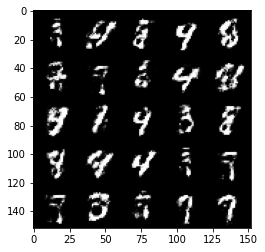

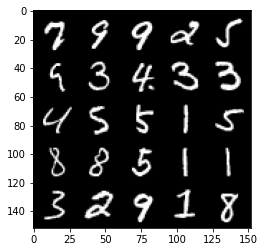

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 1.4756045861244196, discriminator loss: 0.43068580257892586


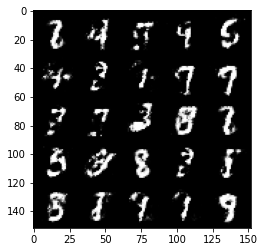

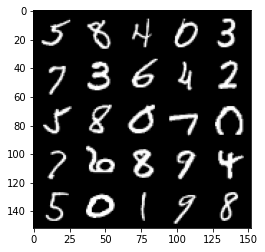

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500: Generator loss: 1.4902638807296742, discriminator loss: 0.4121532056927686


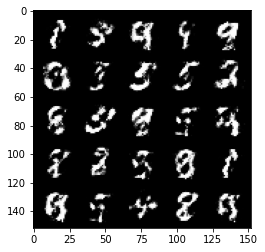

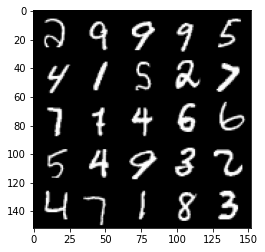

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 1.6582914881706252, discriminator loss: 0.3728258478045464


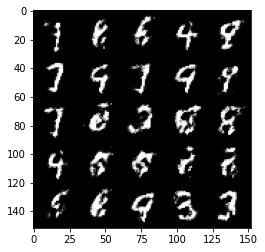

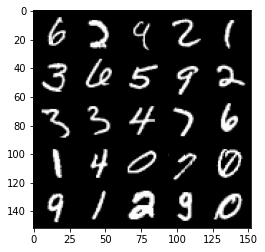

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63500: Generator loss: 1.6851901700496683, discriminator loss: 0.3669303855895994


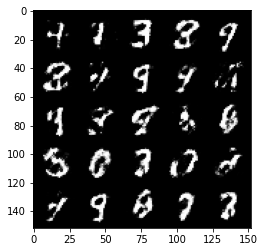

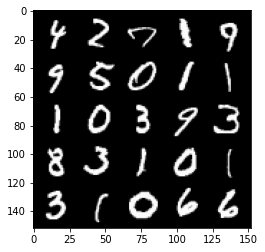

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000: Generator loss: 1.6470392229557023, discriminator loss: 0.37498731189966217


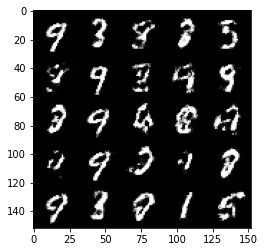

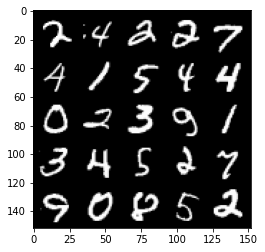

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64500: Generator loss: 1.5857906312942496, discriminator loss: 0.390742151618004


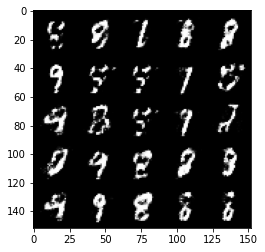

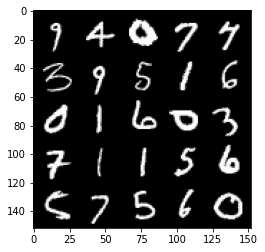

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000: Generator loss: 1.5902821280956259, discriminator loss: 0.38432594680786125


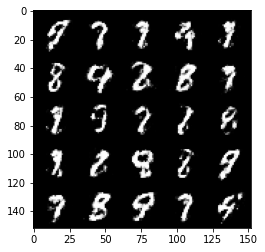

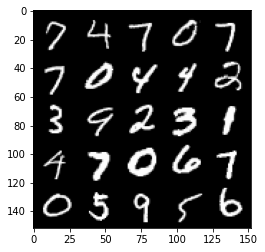

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65500: Generator loss: 1.6345669176578532, discriminator loss: 0.3728432450294493


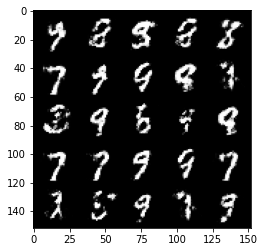

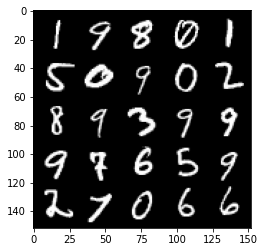

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000: Generator loss: 1.58152744460106, discriminator loss: 0.3840019473433493


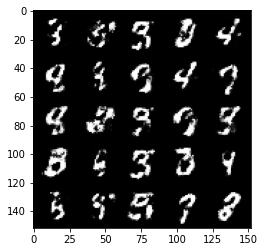

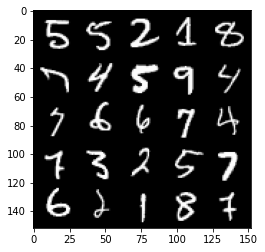

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66500: Generator loss: 1.7178748967647568, discriminator loss: 0.35330250567197813


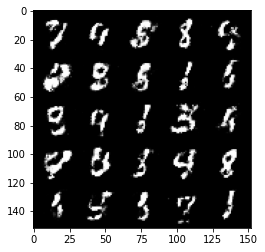

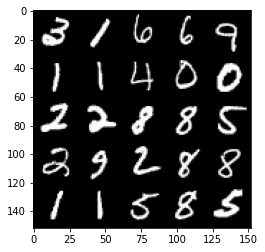

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000: Generator loss: 1.7294006037712093, discriminator loss: 0.3556869182586669


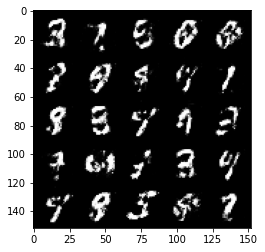

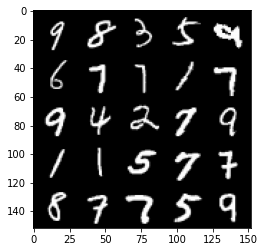

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67500: Generator loss: 1.7395539608001709, discriminator loss: 0.3591001717448232


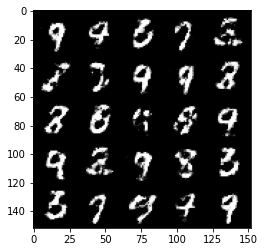

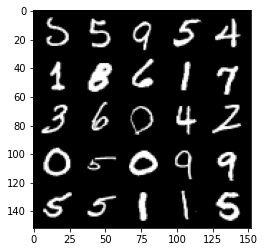

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000: Generator loss: 1.6823197283744806, discriminator loss: 0.38020931780338313


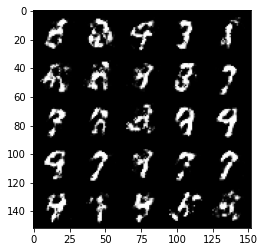

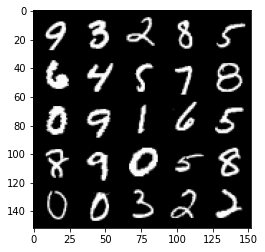

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68500: Generator loss: 1.6840051567554484, discriminator loss: 0.36672117489576345


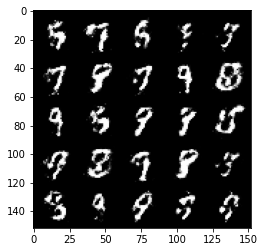

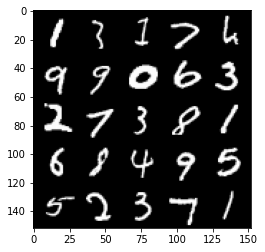

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000: Generator loss: 1.6844004490375502, discriminator loss: 0.358744265496731


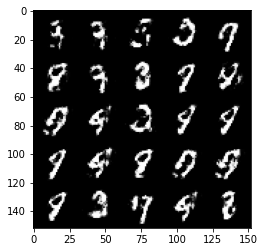

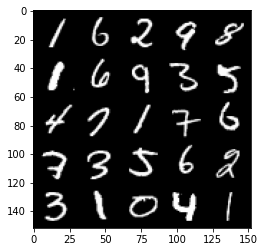

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69500: Generator loss: 1.6749074225425724, discriminator loss: 0.37493771338462833


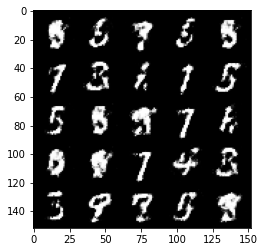

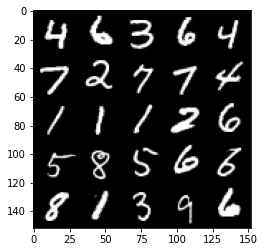

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000: Generator loss: 1.5878246858119958, discriminator loss: 0.3827314426302908


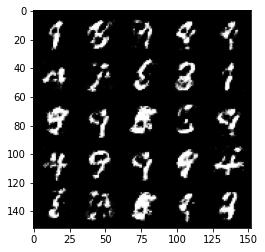

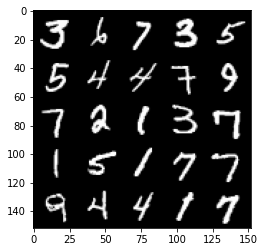

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70500: Generator loss: 1.6546546452045425, discriminator loss: 0.3645072466731072


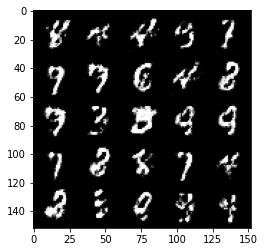

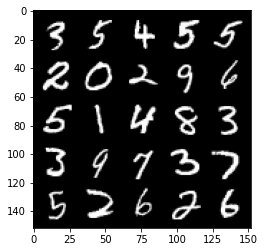

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000: Generator loss: 1.5891216065883627, discriminator loss: 0.39010185587406154


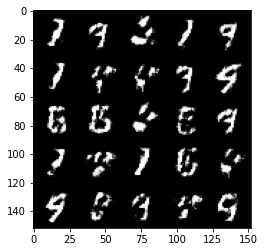

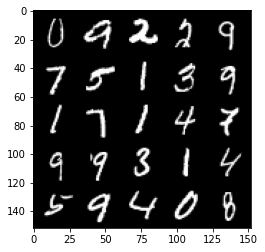

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71500: Generator loss: 1.52181573677063, discriminator loss: 0.4063432086110121


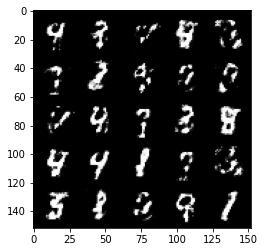

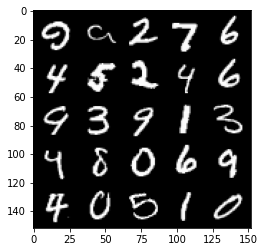

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000: Generator loss: 1.584824245929718, discriminator loss: 0.38073529112339005


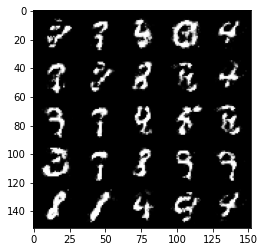

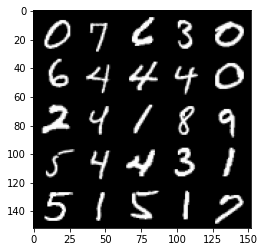

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72500: Generator loss: 1.6252590658664707, discriminator loss: 0.3911664388179783


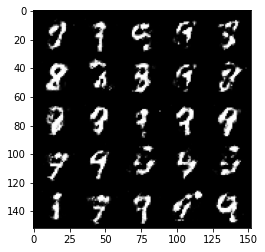

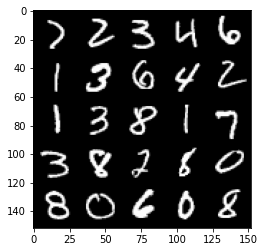

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000: Generator loss: 1.5298229138851178, discriminator loss: 0.41296269541978836


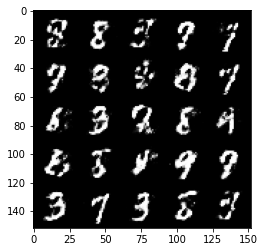

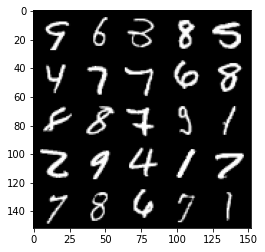

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73500: Generator loss: 1.5660326333045955, discriminator loss: 0.39834377080202094


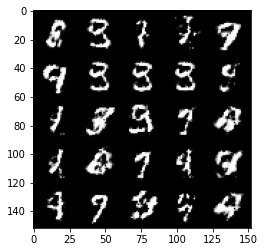

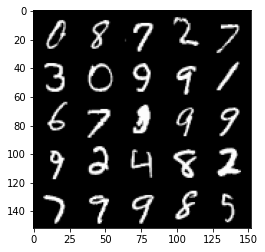

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000: Generator loss: 1.443574605226517, discriminator loss: 0.43935783773660625


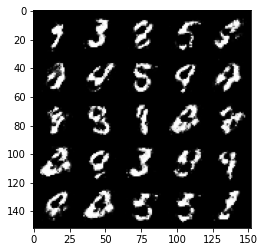

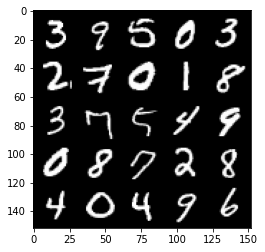

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74500: Generator loss: 1.5164218254089374, discriminator loss: 0.40482794380187975


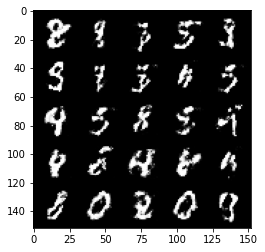

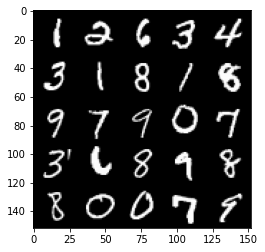

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000: Generator loss: 1.4412847609519968, discriminator loss: 0.4296885205507278


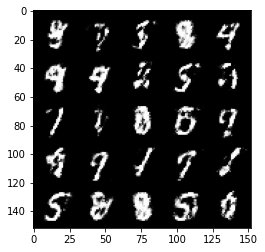

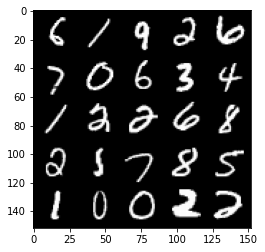

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75500: Generator loss: 1.4755163476467146, discriminator loss: 0.407244836509228


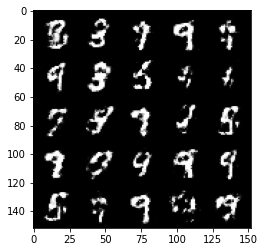

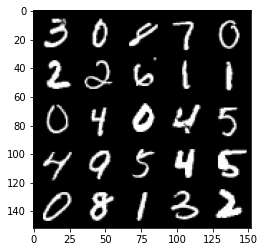

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000: Generator loss: 1.454177983999253, discriminator loss: 0.42945587980747224


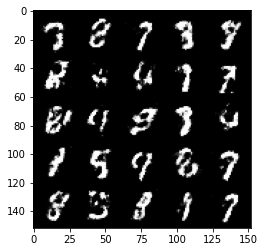

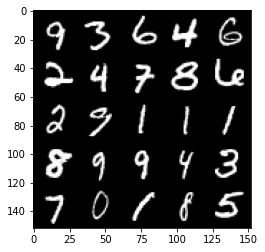

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76500: Generator loss: 1.3959689798355088, discriminator loss: 0.4380346136093138


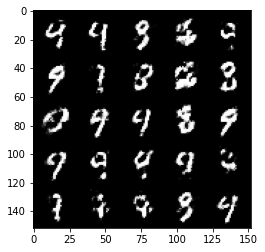

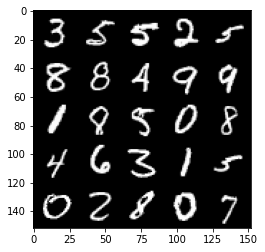

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000: Generator loss: 1.462929660320282, discriminator loss: 0.41092789024114657


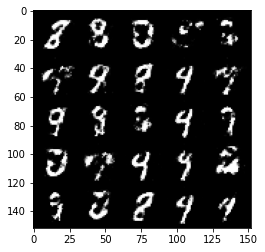

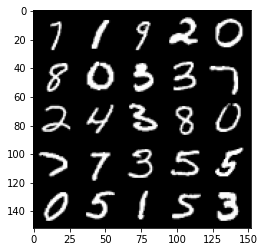

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77500: Generator loss: 1.4121590449810033, discriminator loss: 0.4382606735229489


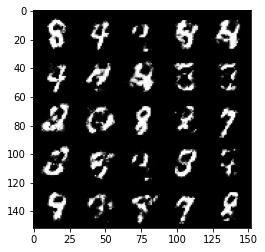

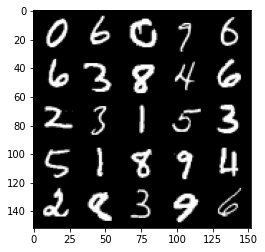

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000: Generator loss: 1.4030412144660944, discriminator loss: 0.43272702902555377


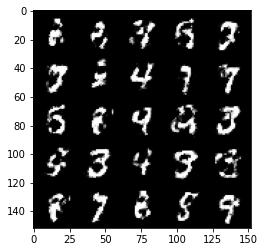

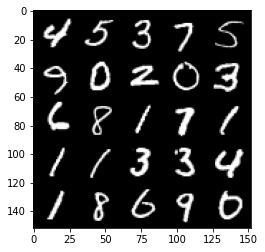

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78500: Generator loss: 1.4063197975158692, discriminator loss: 0.45734609687328326


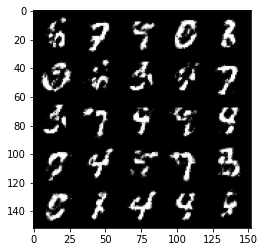

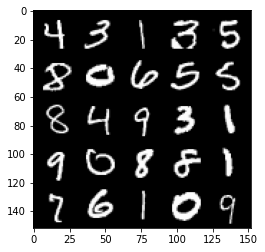

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000: Generator loss: 1.3717411568164832, discriminator loss: 0.4458268899917602


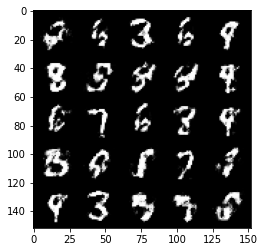

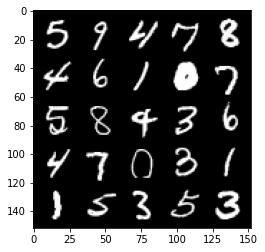

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79500: Generator loss: 1.3901613781452178, discriminator loss: 0.43850681823492066


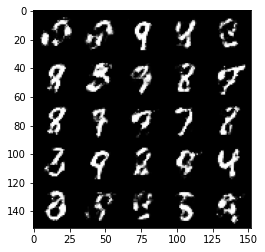

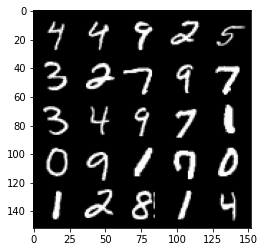

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000: Generator loss: 1.325580828905106, discriminator loss: 0.46483477711677557


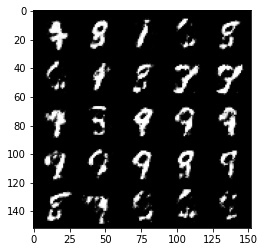

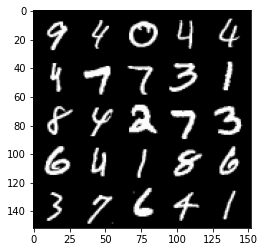

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80500: Generator loss: 1.4122068114280697, discriminator loss: 0.42100008231401453


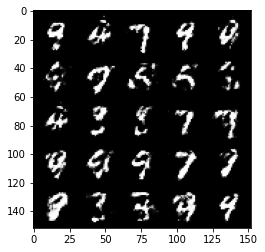

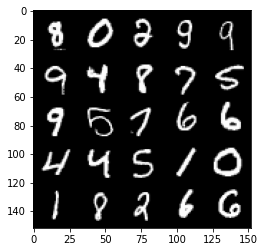

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000: Generator loss: 1.4140834219455711, discriminator loss: 0.415478006541729


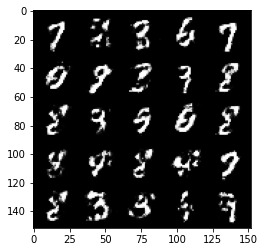

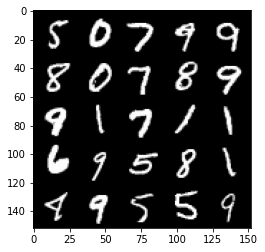

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81500: Generator loss: 1.4088128700256337, discriminator loss: 0.4292018842101099


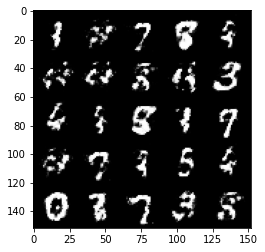

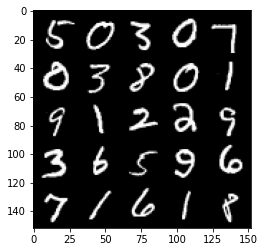

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000: Generator loss: 1.4130449862480152, discriminator loss: 0.4220772821903231


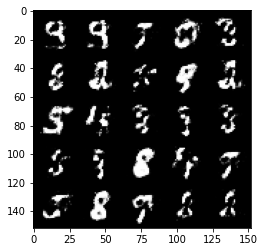

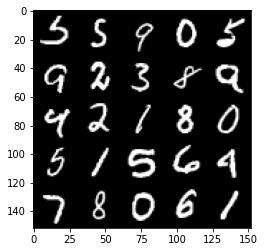

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82500: Generator loss: 1.4096270051002506, discriminator loss: 0.4100508068203931


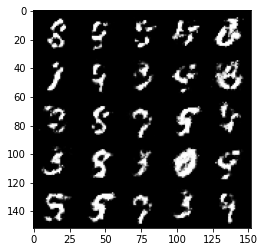

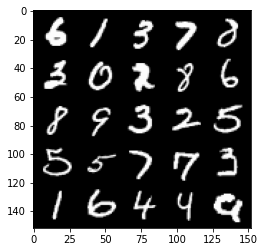

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000: Generator loss: 1.4288791561126704, discriminator loss: 0.42580699497461316


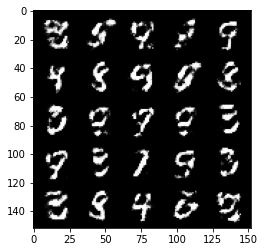

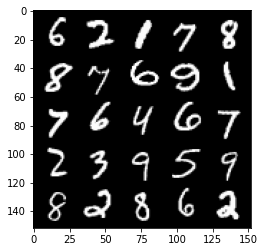

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83500: Generator loss: 1.314787315130234, discriminator loss: 0.46854538595676426


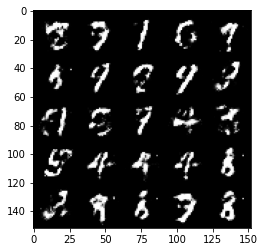

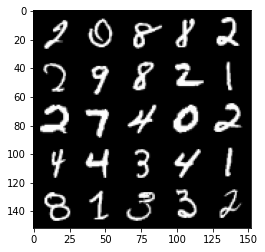

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000: Generator loss: 1.2355748875141144, discriminator loss: 0.4833719537854193


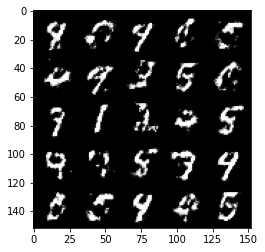

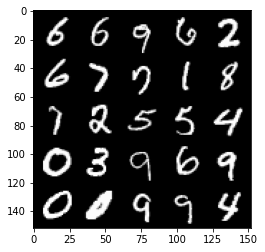

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84500: Generator loss: 1.3665278000831609, discriminator loss: 0.446703614771366


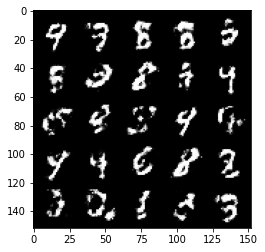

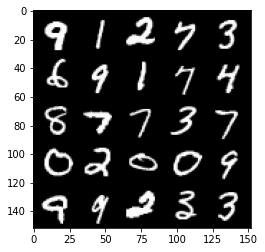

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000: Generator loss: 1.4305908718109135, discriminator loss: 0.4223088811635969


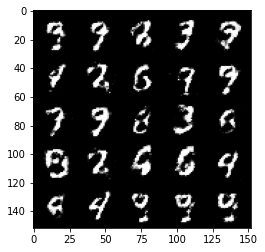

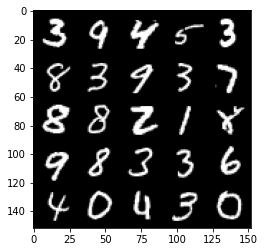

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85500: Generator loss: 1.4432874743938442, discriminator loss: 0.4216828814744952


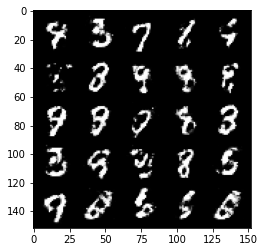

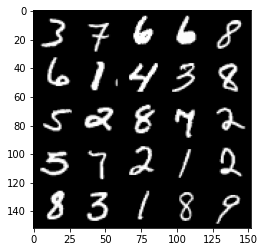

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000: Generator loss: 1.4375362229347233, discriminator loss: 0.4219723107814786


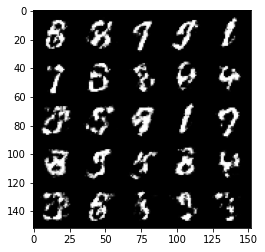

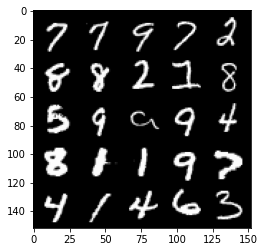

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86500: Generator loss: 1.338343444108962, discriminator loss: 0.4591042177677153


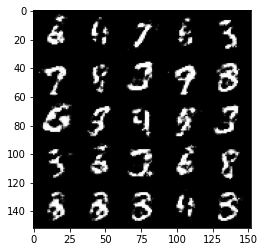

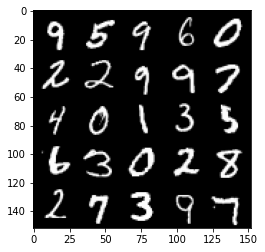

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000: Generator loss: 1.3008516249656672, discriminator loss: 0.45956930571794463


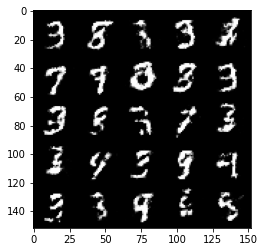

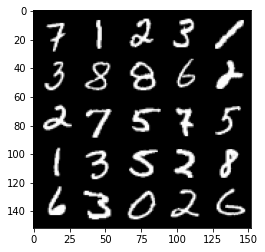

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87500: Generator loss: 1.3621668517589551, discriminator loss: 0.43386713683605127


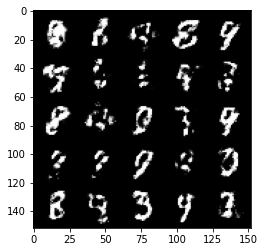

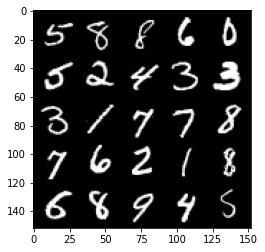

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000: Generator loss: 1.3146771581172942, discriminator loss: 0.4514036152958869


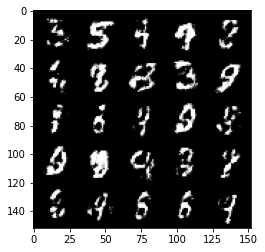

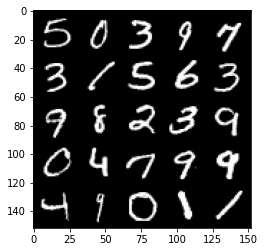

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88500: Generator loss: 1.3946083655357364, discriminator loss: 0.42822170644998575


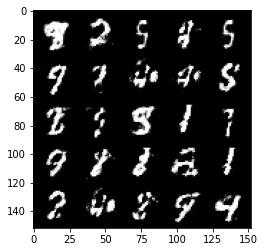

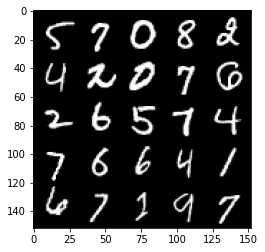

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000: Generator loss: 1.3738808951377872, discriminator loss: 0.4327391463518145


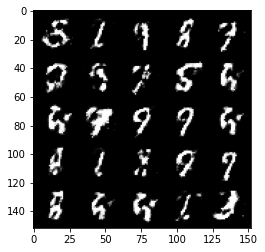

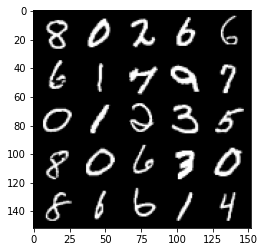

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89500: Generator loss: 1.282623636960981, discriminator loss: 0.48179668599367137


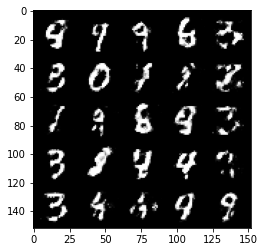

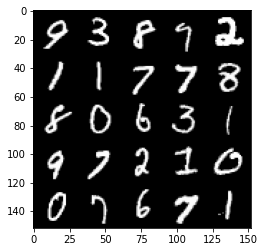

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000: Generator loss: 1.258812904834747, discriminator loss: 0.4707456427812577


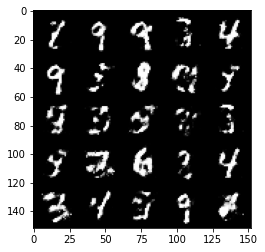

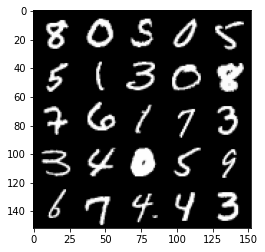

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90500: Generator loss: 1.319107206821441, discriminator loss: 0.4584909889101985


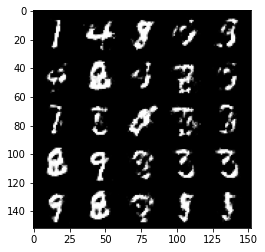

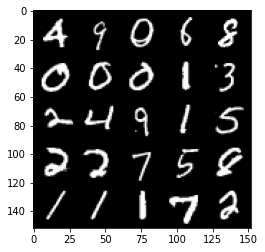

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000: Generator loss: 1.237109396696091, discriminator loss: 0.4766249287724496


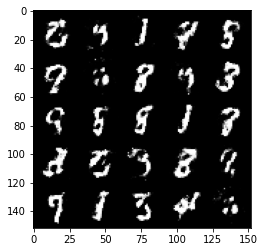

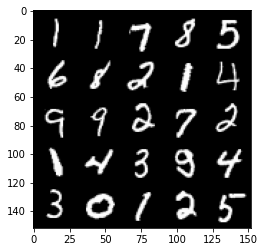

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91500: Generator loss: 1.3344882857799532, discriminator loss: 0.4452972750663755


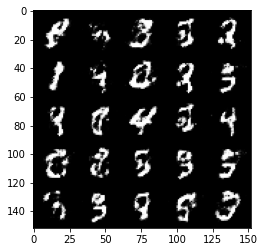

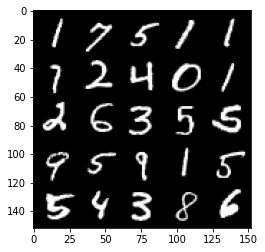

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000: Generator loss: 1.4327757706642141, discriminator loss: 0.4341405336260801


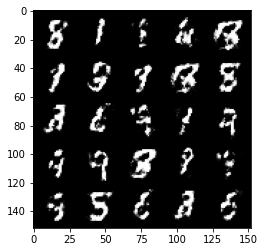

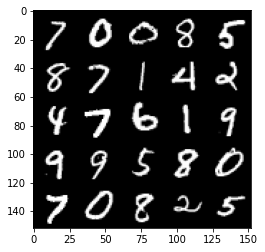

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92500: Generator loss: 1.400110053300858, discriminator loss: 0.43694260042905786


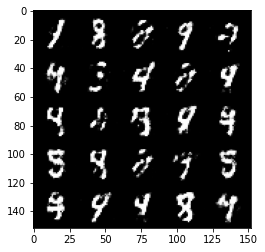

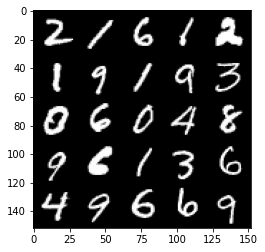

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000: Generator loss: 1.365970243930817, discriminator loss: 0.43436258137226097


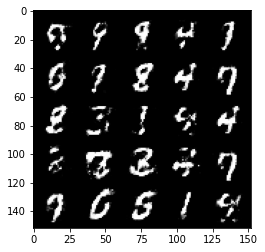

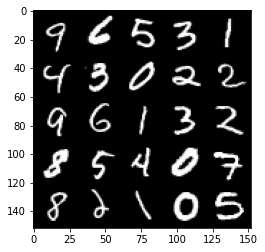

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93500: Generator loss: 1.347689920186999, discriminator loss: 0.44456127369403814


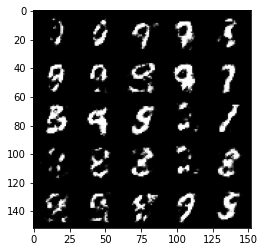

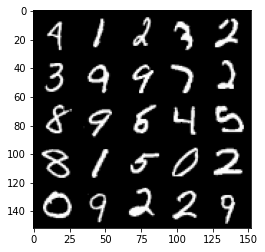

In [ ]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1